# Private Market Stock Price Prediction - SpaceX Bid-Ask Spread
## Author: Faran Sikandar
## Date: 2024-04-25

Private market stock data is sparse (less frequent orders or transactions) and, therefore, prices are much harder to predict than normal stock price prediction. This provides an interesting problem in finance and machine learning modeling in general. 

We have a CSV containing (fake) bid/ask order data for SpaceX. Orders are "indications of interest" from buyers and sellers in the market, NOT closed transactions. Here, our goal was to develop a simple model of bid/ask spread using the data provided, where spreads are modeled (e.g., linear regression, etc.) as a function of order characteristics and/or any public data you can find (e.g., from Yahoo Finance, etc.). 

**Some questions for reflection below...**

---

### **1) Modeling Decisions**

- **Focused on Prediction (Not Causal Inference) + Feature Engineering**  
  In reality, we wouldn't have access to `spread` data ahead of time, so I treated this as a forecasting problem, using `spread_7d` and `spread_7d_future` (shifted 1 period forward).

- **Rolling Spread Calculations**  
  Constructed a rolling 7-day spread `spread_7d`, as well as volatility and entropy metrics. Repeated these for several short, medium, and long-term windows: `7, 14, 28, 56 days`.

- **Book-Level Metrics -> Rolling Values**  
  Imbalance, depth-weighted midprice, slope, last seen bid/ask, etc.

- **Macroeconomic Data -> Rolling Metrics**  
  Stocks: [ARKX, VIX, XLI, SPY, TREASURY_10Y]; Fed: [FED_FUNDS_RATE, CPI, UNEMP_U3, UNEMP_U6, M2].

- Aggregated orders at the daily level for OLS/XGBoost. Would aim to keep multiple orders for Mixed Effects, but this requires more work.

- **Data Imputation**  
  Various data imputation choices along the way. The biggest one was ultimately dropping records with too many NaN values. Forward-filled macro variables. (Would) set spread to 0 or median values on days with no bids/asks for SARIMAX. Other choices are documented in the notebook and code.

- **Chronological Train-Test Split**  
  Used a chronological split (final 20%) for out-of-sample evaluation, without leakage (including standardization *after* split).

- **Modeling Choices**  
  Started with OLS as a baseline, then added XGBoost. Scaffolding for Mixed Effects, SARIMAX, and Bayesian regression is all in place in the code.

- **Model Evaluation**  
  RMSE, MAE, R², MAPE, SMAPE, plus diagnostic plots (residuals, predictions vs. actuals, and various statistical tests for OLS via `statsmodels`).

---

### **2) Areas for Continued Work - Model, Data, or Otherwise**

- **Feature Selection**  
  Our simplified OLS model actually outperformed XGBoost. We need to hone in on feature selection to avoid confusing the model with noise (e.g., Lasso Regression, Random Effects models).

- **Outlining Business Goals + Separating Out Modeling Steps to Chain Together**  
  For example, we can chain or ensemble models: one on causal inference, one on volatility, one on anomaly prediction (to detect spikes/dips), etc. This would yield better results by solving isolated problems one at a time. We may even want to separately model `bid` and `ask` volume-weighted prices (e.g., if there are structural or persistent reasons why `bid` and `ask` prices differ) and calculate `spread` as the difference. There are many ways to break the problem down.

- **Further Modeling Spread Dynamics**  
  Recency is extremely important, but so are long-term trends. We should extend to `_90d` windows too.

- **Time Series, Bayesian Hierarchical, and Ensemble Models**  
  Given the autocorrelated nature of `spread_7d` with `spread_7d_future`, time-series would be a natural next step. I think `SARIMAX` will perform exceptionally well (though imputation will be a challenge). Bayesian modeling will also be interesting, given the sparsity of orders. Ensembling a well-defined causal inference model (e.g., Lasso Regression) with `Prophet`, `GARCH`, or `VAR` models would be interesting, especially focusing on `spread` alone. While `LSTM/GRU` models are fancy, classical ML generally still outperforms neural networks on tabular data (plenty of research supports this).

- **Feature Engineering**  
  Thoughts include:
  - More fine-grained lags: Add more sophisticated lag structures (e.g., exponentially weighted lags).
  - Deeper liquidity metrics: E.g., book-level depth at 10%, 20%, 50% levels of the book (though there may not be enough data for this).
  - Macroeconomic regime indicators: E.g., dummies for bear/bull markets or recession/expansion.
  - Google search trends: Already pulled it, but it was being finicky. We could add more related search terms.
  - Private company news sentiment.

- **Hyperparameter Tuning + Cross-Validation**  
  Tune the models for better fit. Clustered cross-validations according to different economic regimes.

---

### **3) Additional datasets to which may be worthwhile to explore incorporating into the model**

- **Urgency + Risk + Liquidity Data**  
  Any data that helps predict either order urgency, risk aversion, or funding/liquidity constraints will likely improve spread modeling:
  - Macroeconomic events overlay: Fed announcements, CPI prints, IPO windows (this is probably *key*).
  - Order book depth snapshots: E.g., top 5 bids/asks, size per level.
  - Completed transaction data: E.g., actual trade prices, volumes.
  - Order types: E.g., firm vs. soft indications of interest.
  - Counterparty characteristics: E.g., institutional vs. retail, strategic buyer vs. liquidity trader.

- **Industry-Level Data + Proxy Other Companies in Same Category**  
  If we're able to leverage data from *all private* market transactions, then we can get much more detailed `spread` dynamics:
  - Private market valuation trends: Series D/E/F pricing data via Crunchbase, LinkedIn, Layoffs.fyi, etc. This could provide estimates of not only funding but also hiring/firing trends.
  - Historical funding or secondary market liquidity data: On a general level.
  - Company events: Patent filings, quarterly reports, scheduled product launches (or misses).

## Section 0 - Imports/Setup + Variable Definitions

In [1]:
# analysis.ipynb

# imports
# dev tools
import sys
import os
import datetime
import time
import re
from typing import Any, Dict, List, Literal, Union
import warnings

warnings.filterwarnings("ignore")

# setup path for src/ folder
sys.path.append("../src")
# print(sys.path)

# data
import numpy as np
import pandas as pd
import ydata_profiling

# plots
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import SVG
from graphviz import Source
from IPython.display import display
from IPython.display import Image

# models
from pmdarima import auto_arima
import pymc as pm
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.regression.mixed_linear_model import MixedLM
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, export_graphviz
from xgboost import XGBRegressor

# stats
from scipy import stats
import shap

# api
import pandas_datareader as pdr
from pytrends.request import TrendReq
import yfinance as yf


# final styling
plt.style.use("seaborn-v0_8")
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [2]:
# imports - local libraries
from spread_predictor.constants import *
from spread_predictor.data_loader import (
    cleanData,
    load_raw_orders,
    fetch_yahoo_data,
    fetch_fred_data,
    fetch_google_trends,
)
from spread_predictor.features import (
    build_df_daily_calendar,
    build_df_exog,
    compute_df_book_static,
    compute_df_book_rolling,
    compute_df_spread_rolling,
    add_df_features_all,
    build_feature_matrix,
)
from spread_predictor.model import (
    train_test_split_ts,
    standardize_features,
    train_ols,
    train_mixed_effects,
    train_xgboost,
    train_sarimax,
    train_bayesian_regression,
    predict_bayesian_regression,
    evaluate_model,
    evaluate_sarimax,
    plot_bayesian_trace,
    plot_predictions,
    plot_residuals,
)

# check imports
# print(f'VARS_NUMERIC: {VARS_NUMERIC}')
# print(f'VARS_NUMERIC_AGG: {VARS_NUMERIC_AGG}')
print(f"VARS_CATEGORICAL: {VARS_CATEGORICAL}")
# print(f'VARS_CATEGORICAL_TS: {VARS_CATEGORICAL_TS}')
print(f"VARS_DUMMIES: {VARS_DUMMIES}")
print(f"VARS_DATES: {VARS_DATES}")
print(f"DIRECTORY: {DIRECTORY}")
os.getcwd()

VARS_CATEGORICAL: ['direction', 'structure']
VARS_DUMMIES: ['direction', 'structure']
VARS_DATES: ['date']
DIRECTORY: /Users/faransikandar/Documents/Git_Faran/Demos/stock-spread-model


'/Users/faransikandar/Documents/Git_Faran/Demos/stock-spread-model/notebooks'

## Section 1 - Data ETL + EDA
### Section 1A - Load Raw Data + Preview - SpaceX Orders

In [3]:
# step 1 - load your raw order book CSV
df_orders_raw = load_raw_orders(os.path.join(DATA_PATH, DATA_FILENAME_SPACEX_ORDERS))

# preview order data
print(
    f"**Preview the Order Data:**\n\nRecords: {df_orders_raw.shape[0]}\nVariables: {df_orders_raw.shape[1]}"
)
print(f"\nUnique Order Dates: {df_orders_raw['Date'].nunique()}")
print(f"\nOrder Count Bid/Ask: {df_orders_raw['direction'].value_counts()}")
print(f"\n**Data Types:**\n\n{df_orders_raw.dtypes}")
print(f"\n**Null Data:**\n\n{df_orders_raw.isnull().sum()}")
df_orders_raw.head()

**Preview the Order Data:**

Records: 1708
Variables: 7

Unique Order Dates: 789

Order Count Bid/Ask: direction
sell    926
buy     782
Name: count, dtype: int64

**Data Types:**

direction         object
Date              object
Price            float64
size             float64
structure         object
carry             object
managementFee     object
dtype: object

**Null Data:**

direction          0
Date               0
Price             63
size               0
structure          0
carry            714
managementFee    745
dtype: int64


,direction,Date,Price,size,structure,carry,managementFee
0,sell,"Aug 15, 2016",275.0,1560000.0,direct,NaN,NaN
1,sell,"Aug 15, 2016",275.0,1040000.0,direct,NaN,NaN
2,buy,"Nov 11, 2016",275.0,15000000.0,unspecified,NaN,NaN
3,buy,"Jan 8, 2017",301.0,16500000.0,unspecified,NaN,NaN
4,sell,"Jan 8, 2017",295.0,3584000.0,direct,NaN,NaN


### Section 1B - Clean Data - SpaceX Orders

In [4]:
# initialize clean_data_orders
clean_data_orders_obj = cleanData(df_orders_raw)
df_orders = clean_data_orders_obj.clean_df(
    col_date_key=COL_DATE_KEY,
    date_vars=VARS_DATES,
    pct_vars=VARS_PERCENT,
    cat_vars=VARS_CATEGORICAL,
    numeric_vars=VARS_NUMERIC,
    rename_vars=VARS_RENAME,
).df


print(
    f"**Preview the Order Data:**\n\nRecords: {df_orders.shape[0]}\nVariables: {df_orders.shape[1]}"
)
print(f"\nUnique Order Dates: {df_orders_raw['Date'].nunique()}")
print(
    f"\nCount Dates with 1+ Buy Orders: {df_orders[df_orders['direction'] == 'buy'].groupby('date')['price'].max().reset_index().shape}"
)
print(
    f"\nCount Dates with 1+ Sell Orders: {df_orders[df_orders['direction'] == 'sell'].groupby('date')['price'].max().reset_index().shape}"
)
print(f"\n**Data Types:**\n\n{df_orders.dtypes}")
print(f"\n**Null Data:**\n\n{df_orders_raw.isnull().sum()}")
print(f"\n**Data Description:**\n\n{df_orders.describe()}")
df_orders.head()

**Preview the Order Data:**

Records: 1708
Variables: 7

Unique Order Dates: 789

Count Dates with 1+ Buy Orders: (416, 2)

Count Dates with 1+ Sell Orders: (540, 2)

**Data Types:**

direction               category
date              datetime64[ns]
price                    float64
size                     float64
structure               category
carry                    float64
management_fee           float64
dtype: object

**Null Data:**

direction          0
Date               0
Price             63
size               0
structure          0
carry            714
managementFee    745
dtype: int64

**Data Description:**

                                date        price          size       carry  \
count                           1708  1645.000000  1.708000e+03  994.000000   
mean   2022-07-30 16:39:03.793910784   334.319179  1.998598e+07    0.088008   
min              2016-08-15 00:00:00   125.000000  4.337500e+02    0.000000   
25%              2021-06-20 12:00:00   170.000000  2.0

,direction,date,price,size,structure,carry,management_fee
0,sell,2016-08-15,275.0,1560000.0,direct,NaN,NaN
1,sell,2016-08-15,275.0,1040000.0,direct,NaN,NaN
2,buy,2016-11-11,275.0,15000000.0,unspecified,NaN,NaN
13,sell,2017-01-08,205.0,34000000.0,spv,0.0,0.0
12,buy,2017-01-08,235.0,316800.0,unspecified,NaN,NaN


### Section 1C - EDA - Visualize SpaceX Order Patterns - Price + Size Over Time

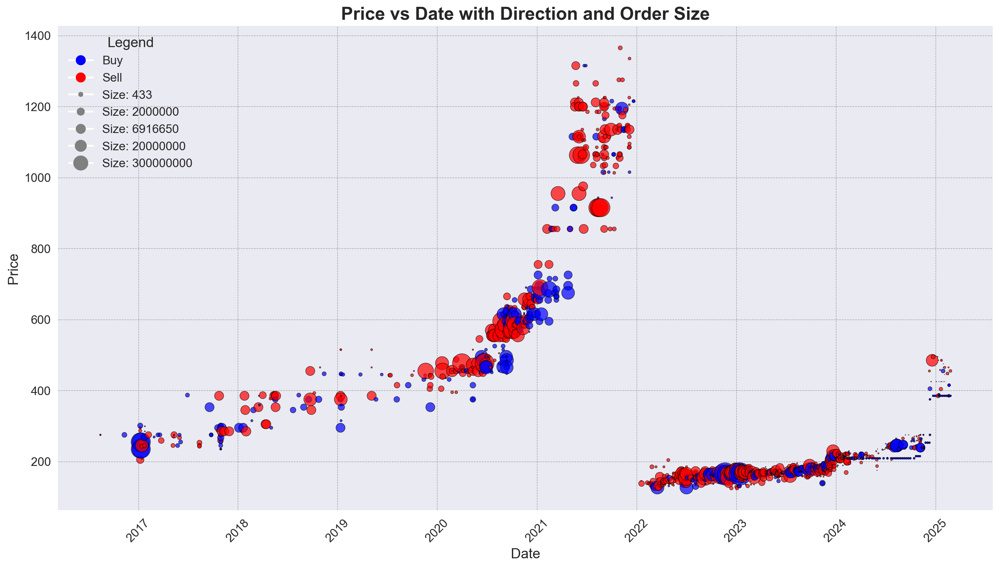

In [5]:
# normalize the size for better visualization
normalized_size = (
    df_orders["size"] / df_orders["size"].max()
) * 500  # Scale sizes to a smaller range

# plot setup
plt.figure(figsize=(14, 8))

# scatter plot with color by direction and size by order size
scatter = plt.scatter(
    df_orders["date"],
    df_orders["price"],
    c=df_orders["direction"].map({"buy": "blue", "sell": "red"}),
    s=normalized_size,  # Use normalized size
    alpha=0.7,  # Add transparency
    edgecolor="k",
    linewidth=0.5,
)

# add legend for direction and size scale
legend_elements = [
    plt.Line2D(
        [0],
        [0],
        marker="o",
        color="w",
        label="Buy",
        markerfacecolor="blue",
        markersize=10,
    ),
    plt.Line2D(
        [0],
        [0],
        marker="o",
        color="w",
        label="Sell",
        markerfacecolor="red",
        markersize=10,
    ),
    plt.Line2D(
        [0],
        [0],
        marker="o",
        color="w",
        label=f'Size: {int(df_orders["size"].min())}',
        markerfacecolor="gray",
        markersize=5,
    ),
    plt.Line2D(
        [0],
        [0],
        marker="o",
        color="w",
        label=f'Size: {int(df_orders["size"].quantile(0.25))}',
        markerfacecolor="gray",
        markersize=8,
    ),
    plt.Line2D(
        [0],
        [0],
        marker="o",
        color="w",
        label=f'Size: {int(df_orders["size"].median())}',
        markerfacecolor="gray",
        markersize=10,
    ),
    plt.Line2D(
        [0],
        [0],
        marker="o",
        color="w",
        label=f'Size: {int(df_orders["size"].quantile(0.75))}',
        markerfacecolor="gray",
        markersize=12,
    ),
    plt.Line2D(
        [0],
        [0],
        marker="o",
        color="w",
        label=f'Size: {int(df_orders["size"].max())}',
        markerfacecolor="gray",
        markersize=15,
    ),
]

plt.legend(
    handles=legend_elements,
    title="Legend",
    loc="upper left",
    fontsize=12,
    title_fontsize=14,
)

# labels and title
plt.title("Price vs Date with Direction and Order Size", fontsize=18, fontweight="bold")
plt.xlabel("Date", fontsize=14)
plt.ylabel("Price", fontsize=14)
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)

# add grid for better readability
plt.grid(color="gray", linestyle="--", linewidth=0.5, alpha=0.7)

# show plot
plt.tight_layout()
plt.show()

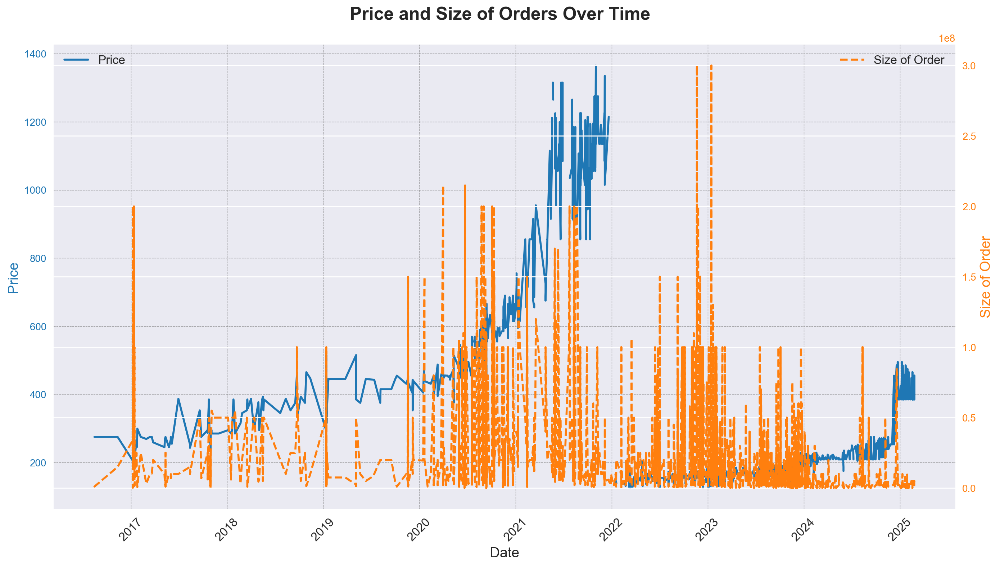

In [6]:
# [lot setup
fig, ax1 = plt.subplots(figsize=(14, 8))

# plot price on the left y-axis
color = "tab:blue"
ax1.set_xlabel("Date", fontsize=14)
ax1.set_ylabel("Price", color=color, fontsize=14)
ax1.plot(df_orders["date"], df_orders["price"], color=color, label="Price", linewidth=2)
ax1.tick_params(axis="y", labelcolor=color)
ax1.tick_params(axis="x", labelsize=12, rotation=45)
ax1.grid(color="gray", linestyle="--", linewidth=0.5, alpha=0.7)

# create a second y-axis for size
ax2 = ax1.twinx()
color = "tab:orange"
ax2.set_ylabel("Size of Order", color=color, fontsize=14)
ax2.plot(
    df_orders["date"],
    df_orders["size"],
    color=color,
    label="Size of Order",
    linewidth=2,
    linestyle="--",
)
ax2.tick_params(axis="y", labelcolor=color)

# add title and legend
fig.suptitle("Price and Size of Orders Over Time", fontsize=18, fontweight="bold")
ax1.legend(loc="upper left", fontsize=12)
ax2.legend(loc="upper right", fontsize=12)

# adjust layout
plt.tight_layout()
plt.show()

## Section 2 - Fetch External Variables - Yahoo! Finance + Federal Reserve Economic Data (FRED) + Google Search Trends

- `build_df_exog` - Fetches external variables from sources like `Yahoo! Finance`, `FRED`, and `Google Search Trends`
    - **Yahoo! Finance**
        - `spy` - S&P500
        - `vix` - volatility measure
        - `arkx` - ARK space + expoloration innovation ETF
        - `xli` - industrial sector SPDR fund
        - `treasury_10y` - treasury note 10-year yield index
    - **FRED**
        - `fed_rate` - federal funds interbank exchange interest rate
        - `cpi` - consumer price index
        - `unemp_u3` - unemployment rate, official - includes only people actively seeking work
        - `unemp_u6` - unemployment rate, includes - includes marginally attached workers and those employed part-time for economic reasons
        - `m2` - M2 money supply - broad measure of the money supply that includes M1 (currency in circulation and checking accounts) plus savings deposits, money market accounts, and small time deposits (under $100,000). It represents the total amount of money readily available for spending, along with assets that can be easily converted to cash
    - **Google Trends**
        - `SpaceX` - excluded because of rate-limiting issues, for now

In [7]:
# step 2 - build a df_daily calendar
full_dates_idx, df_daily = build_df_daily_calendar(df_orders)

# step 3 - fetch exog vars
df_exog = build_df_exog(
    date_index=full_dates_idx,
    df_daily=df_daily,
    dict_yf_tickers=VARS_YF,
    dict_fred_series=VARS_FRED,
    list_gt_keywords=VARS_GOOGLE,
)

YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  1 of 1 completed

1 Failed download:
['^VIX']: YFRateLimitError('Too Many Requests. Rate limited. Try after a while.')
[*********************100%***********************]  1 of 1 completed

1 Failed download:
['SPY']: YFRateLimitError('Too Many Requests. Rate limited. Try after a while.')
[*********************100%***********************]  1 of 1 completed

1 Failed download:
['ARKX']: YFRateLimitError('Too Many Requests. Rate limited. Try after a while.')
[*********************100%***********************]  1 of 1 completed

1 Failed download:
['XLI']: YFRateLimitError('Too Many Requests. Rate limited. Try after a while.')
[*********************100%***********************]  1 of 1 completed

1 Failed download:
['^TNX']: YFRateLimitError('Too Many Requests. Rate limited. Try after a while.')



VARS_YF: {'vix': '^VIX', 'spy': 'SPY', 'arkx': 'ARKX', 'xli': 'XLI', 'treasury_10y': '^TNX'}

**Preview the Yahoo! Finance Data:**

Records: 3116
Variables: 5

**Data Types:**

vix             float64
spy             float64
arkx            float64
xli             float64
treasury_10y    float64
dtype: object

**Null Data:**

vix             3116
spy             3116
arkx            3116
xli             3116
treasury_10y    3116
dtype: int64

df_yf_head:             vix  spy  arkx  xli  treasury_10y
2016-08-15  NaN  NaN   NaN  NaN           NaN
2016-08-16  NaN  NaN   NaN  NaN           NaN
2016-08-17  NaN  NaN   NaN  NaN           NaN
2016-08-18  NaN  NaN   NaN  NaN           NaN
2016-08-19  NaN  NaN   NaN  NaN           NaN
VARS_FRED: {'fed_rate': 'FEDFUNDS', 'cpi': 'CPIAUCSL', 'unemp_u3': 'UNRATE', 'unemp_u6': 'U6RATE', 'm2': 'M2SL'}

**Preview the FRED Data:**

Records: 3116
Variables: 5

**Data Types:**

fed_rate    float64
cpi         float64
unemp_u3    float64
unemp_u6    float

## Section 3 - Feature Engineering

- **`compute_df_book_static`** - Calculates book-level features for most recent bids / asks, including:
    - `bid_last_price_max`
    - `bid_last_size_max`
    - `ask_last_price_min`
    - `ask_last_size_min`
    - `days_since_bid`
    - `days_since_ask`
    - `days_ask_minus_bid` (days between most recent ask and most recent bid)
- **`compute_df_book_rolling`** - Calculates book-level rolling features over windows - e.g. max bid price over last n days (n=7 by default)
    - `book_imbalance_7d`
    - `depth_midprice_7d`
    - `bid_slope_7d`
    - `ask_slope_7d`
    - `bid_count_7d`
    - `ask_count_7d`
    - `bid_size_total_7d`
    - `ask_size_total_7d`
- **`compute_df_spread_rolling`** - Calculates spread-related features over windows (n=7 by default)
    - `bid_max_1d`
    - `ask_min_1d`
    - `bid_max_7d`
    - `ask_min_7d`
    - `spread_7d`
    - `spread_7d_future` (shift `spread_7d` forward one period -> for `y_target`)
- **`add_df_features_all`** - Consolidates all features - for fxns with `_rolling` ability, include several windows - `[7, 14, 28, 56]` - included to get short, medium, and long-term dynamics. Also add:
    - `imbalance_ratio_7d_28d`
    - `imbalance_ratio_7d_56d`
    - `depth_midprice_ratio_7d_28d`
    - `depth_midprice_ratio_7d_56d`
    - `spread_volatility_7d`
    - `spread_entropy_7d`
- **`build_feature_matrix`** - Build final dataframes
    - Handles dummy variable calculation for categorical variabels
    - Imputations or dropping `isnan`, as necessary
    - Splitting into `X` and `y`

In [8]:
# compute spread + rolling features
# book features
df_last = compute_df_book_static(df_orders=df_orders)

df_last shape: (3116, 9)

df_last dtypes: 
bid_last_price_max           float64
bid_last_size_max            float64
ask_last_price_min           float64
ask_last_size_min            float64
bid_last_date         datetime64[ns]
ask_last_date         datetime64[ns]
days_since_bid               float64
days_since_ask               float64
days_ask_minus_bid           float64
dtype: object

df_last isna sum: 
bid_last_price_max    88
bid_last_size_max     88
ask_last_price_min     0
ask_last_size_min      0
bid_last_date         88
ask_last_date          0
days_since_bid        88
days_since_ask         0
days_ask_minus_bid    88
dtype: int64

df_last head: 
            bid_last_price_max  bid_last_size_max  ask_last_price_min  \
2016-08-15                 NaN                NaN               275.0   
2016-08-16                 NaN                NaN               275.0   
2016-08-17                 NaN                NaN               275.0   
2016-08-18                 NaN              

We see upon plotting days between ask and bid `days_ask_minus_bid` that the values cluster around 0. But this provides **important intuition for what our `y_target` should be**. `spread_7d` would capture about 1/2 the data, zooming out to `spread_14d` might capture 2/3.

**NOTE** 

`days_ask_minus_bid >= 0` means the ask came on or after the bid 
- e.g. `+3 Days = January 5 (Ask) - January 2 (Bid)` 

`days_ask_minus_bid < 0` implies the ask came before the bid 
- e.g. `-3 Days = January 2 (Ask) - January 5 (Bid)`

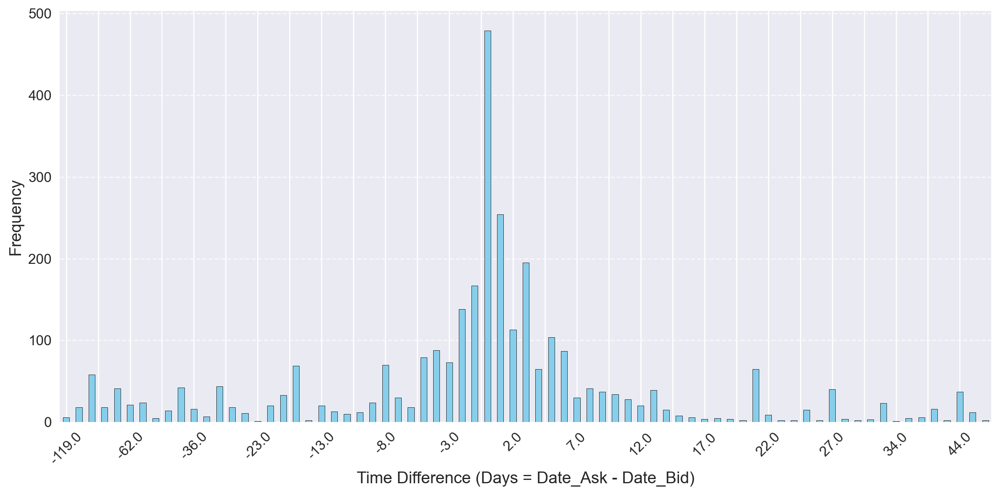

In [9]:
# plot for days since bid/ask
plt.figure(figsize=(12, 6))
df_last["days_ask_minus_bid"].value_counts().sort_index().plot(
    kind="bar", color="skyblue", edgecolor="black"
)
plt.xlabel("Time Difference (Days = Date_Ask - Date_Bid)", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.xticks(fontsize=12, rotation=45)

# adjust x-axis tick frequency
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(nbins=30))  # Show fewer ticks

plt.yticks(fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

In [10]:
# book rolling features
df_book = compute_df_book_rolling(df_orders=df_orders, window_days=WINDOW_DAYS)

df_book shape: (3116, 8)

df_book dtypes: 
book_imbalance_7d    float64
depth_midprice_7d    float64
slope_bid_7d         float64
slope_ask_7d         float64
bid_count_7d           int64
ask_count_7d           int64
bid_size_total_7d    float64
ask_size_total_7d    float64
dtype: object

df_book isna sum: 
book_imbalance_7d     977
depth_midprice_7d     977
slope_bid_7d         2020
slope_ask_7d         1857
bid_count_7d            0
ask_count_7d            0
bid_size_total_7d       0
ask_size_total_7d       0
dtype: int64


In [11]:
# spread features
df_spread = compute_df_spread_rolling(df_orders=df_orders, window_days=WINDOW_DAYS)

df_spread shape: (3116, 6)

df_spread dtypes: 
bid_max_1d          float64
ask_min_1d          float64
bid_max_7d          float64
ask_min_7d          float64
spread_7d           float64
spread_7d_future    float64
dtype: object

df_spread isna sum: 
bid_max_1d          2711
ask_min_1d          2588
bid_max_7d          1454
ask_min_7d          1370
spread_7d           1822
spread_7d_future    1822
dtype: int64


In [12]:
%%capture
# add in all features (inheriting from the above)
df_all = add_df_features_all(
    df_exog=df_exog, df_last=df_last, df_orders=df_orders, list_windows=LIST_WINDOWS
)

In [13]:
# # df_all cols check
# print(len(df_all.columns))
# print(list(df_all.columns))
# # df_all nan check
# dict(df_all.isna().sum())

## Section 4 - Pre-Modeling EDA
### Section 4A - Spread_7D - Y_Target Feature, Derived from df_all

We see there are a lot of gaps in `spread_7d`, but it is more frequent and helps smooth out the otherwise sparse order data. And we can see that perhaps it tends to a mean of 0 in absolute terms.

Depending on the task at hand, e.g. wanting to predict arbitrage opportunities - we may want to frame this as an anomaly prediction problem in the future.

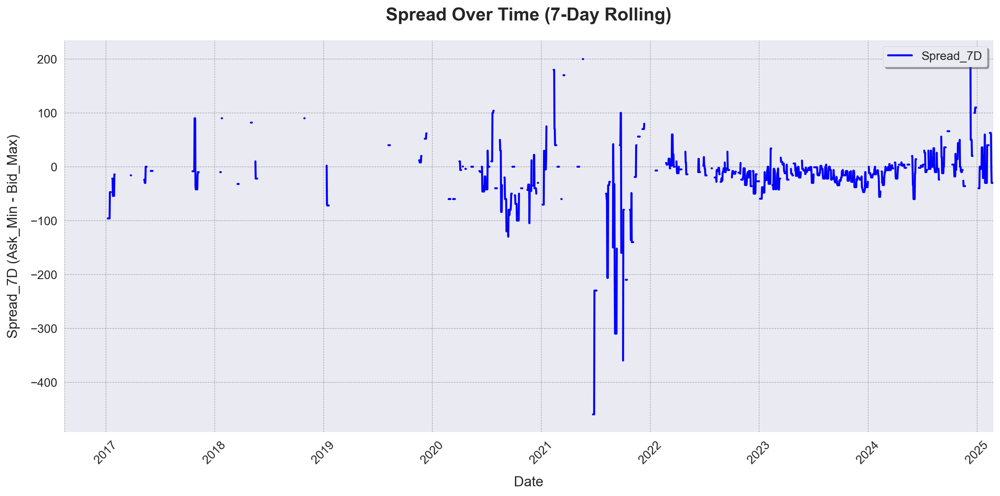

In [14]:
# spread_7d plot
# Plot spread_7d
plt.figure(figsize=(14, 7))

# Plot the spread_7d column
df_all["spread_7d"].plot(color="blue", label="Spread_7D", linewidth=2)

# Add title and labels with improved formatting
plt.title("Spread Over Time (7-Day Rolling)", fontsize=18, fontweight="bold", pad=20)
plt.xlabel("Date", fontsize=14, labelpad=10)
plt.ylabel("Spread_7D (Ask_Min - Bid_Max)", fontsize=14, labelpad=10)

# Add legend with better placement
plt.legend(loc="upper right", fontsize=12, frameon=True, shadow=True)

# Improve x-axis readability
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)

# Add grid for better readability
plt.grid(color="gray", linestyle="--", linewidth=0.5, alpha=0.7)

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()

### Section 4B - YData Profiling, Including Pearson Correlations

**NOTE - Takes awhile to compute (~1 minutes) - only compute on final pass**

Useful for general EDA / data inspection...

In [15]:
# profiling - df_all
profile_df_all = ydata_profiling.ProfileReport(
    df_all,
    title="Profile Report: All Data",
    minimal=True,
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": False},
        "kendall": {"calculate": False},
        "phi_k": {"calculate": False},
        "cramers": {"calculate": False},
    },
)
profile_df_all.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 121/121 [00:00<00:00, 184.28it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Section 5 - Modeling Decisions - Data Imputations, Splits, etc
### Section 5A - X, y Creation

Using only numeric variables here. Categorical variables - `direction` and `structure` are being dropped b/c of (1) complexity of being able to model at order-level, (2) difficulty of being able to predict / have access to categorical variables before prediction time, i.e. t-1. E.g. Would be very difficult to predict `direction ~ buy OR sell` (this should really be a separate model anyway) or `structure ~ direct, spv, forward, unspecified, etc` - though, if we saw something like `forward`, that might be a strong signal.

In [16]:
%%capture
# build final feature matrix
X, y = build_feature_matrix(
    df_all=df_all,
    y_target=Y_TARGET,
    window_days=WINDOW_DAYS,
    list_windows=LIST_WINDOWS,
    vars_cat=VARS_CATEGORICAL,
    model_order_level=MODEL_ORDER_LEVEL,
    drop_days_with_invalid_spread=DROP_DAYS_WITH_INVALID_SPREAD,
    imputation_method=SPREAD_IMPUTATION_METHOD,
)

In [17]:
# # check for col names and nans
# print(X.shape)
# print(X.columns)
# dict(X.isna().sum())

In [18]:
# # Checking X for invalid values
# # print(X.describe())  # Check for extremely large values
# dict(np.isinf(X).sum())  # Check for infinity values

## Section 6 - Modeling

The data is already truncated by date - i.e. not a full time series, since there are some days with invalid spread - and we've selected `DROP_DAYS_WITH_INVALID_SPREAD = True`. 

Nonetheless, there are still some nans in the data - similarly, probably due to those gaps in activity. We'll ave to either impute data or drop cols with null data. We'll drop rows with any nans for ease - these gaps mainly come from days without bids / asks.

**Data Modeling Strategy:**
- We start with `1,708 original records` in the `order data`
- `3,116 unique dates` from the `start to the end` of the order data
- `1,294 records` where `y_target = spread_7d_future` is `not null`
- To be further filtered down based on nulls in the predictor variables - these are the `top missing values`:
    - `943 records` where `bid_max_1d` is `null`
    - `886 records` where `ask_min_1d` is `null`
    - `103 records` where `spread_7d` is `null`
    - `111 records` where `spread_entoropy_7d` is `null`
    - `102 records` where `spread_volatility_7d` is `null`

The other engineered features should stand in well for the missing `_1d` and `_7d` book-level data - so it's better we just drop those columns and leverage other features which retain some information
- `Final X, y` winnows down to `1,127 records` if we just drop the `_1d` features, as opposed to `1,167 records` if we also drop the `_7d` features - the `_7d` features probably have a lot of predictive power, so let's keep those in, especially since it's not changing the sample population much
- We can technically used many different dataset creation strategies for different types of models - but I'll keep it simple here, using the same dfs for both an `OLS model` and an `XGBoost` model ...time-series like `SARIMAX` would require preserving all original `3,116 days` (or aggregating at week/monthly level) - and would require `careful imputation choices`.

**Data Modeling Summary:**

Upon inspection, the outcomes below are not unexpected - **simplified models like OLS with some feature selection using 10 variables actually out-perform XGBoost with ~113 variables thrown at it**. We did a great job feature engineering to find the important features - but on out-of-sample predictions, the additional data is serving mostly as noise to confuse the model more.

**Promising next steps would include some deeper thought into feature selection (Lasso Regression, Random Effects models), modeling `spread` dynamics, time-series, and Bayesian modeling.**

### Section 6A - OLS Baseline - With Top 10 Features and With All Features - Model Training + Evaluation


In [19]:
# drop rows with most missingness, and drop rows with remaining nans
# NOTE - dropping 'spread_7d', 'spread_entropy_7d', 'spread_volatility_7d' as well -> ends with 1,167 rows
X_feat = X[
    [col for col in X.columns if col not in ["bid_max_1d", "ask_min_1d"]]
].dropna()
print(X_feat.shape)
# check for constants
print(X_feat.columns[X_feat.nunique() <= 1])

(0, 113)
Index(['vix', 'spy', 'arkx', 'xli', 'treasury_10y', 'fed_rate', 'cpi',
       'unemp_u3', 'unemp_u6', 'm2',
       ...
       'depth_midprice_ratio_7d_28d', 'depth_midprice_ratio_7d_56d',
       'spread_volatility_7d', 'spread_entropy_7d', 'spread_volatility_14d',
       'spread_entropy_14d', 'spread_volatility_28d', 'spread_entropy_28d',
       'spread_volatility_56d', 'spread_entropy_56d'],
      dtype='object', length=113)


ValueError: The condensed distance matrix must contain only finite values.

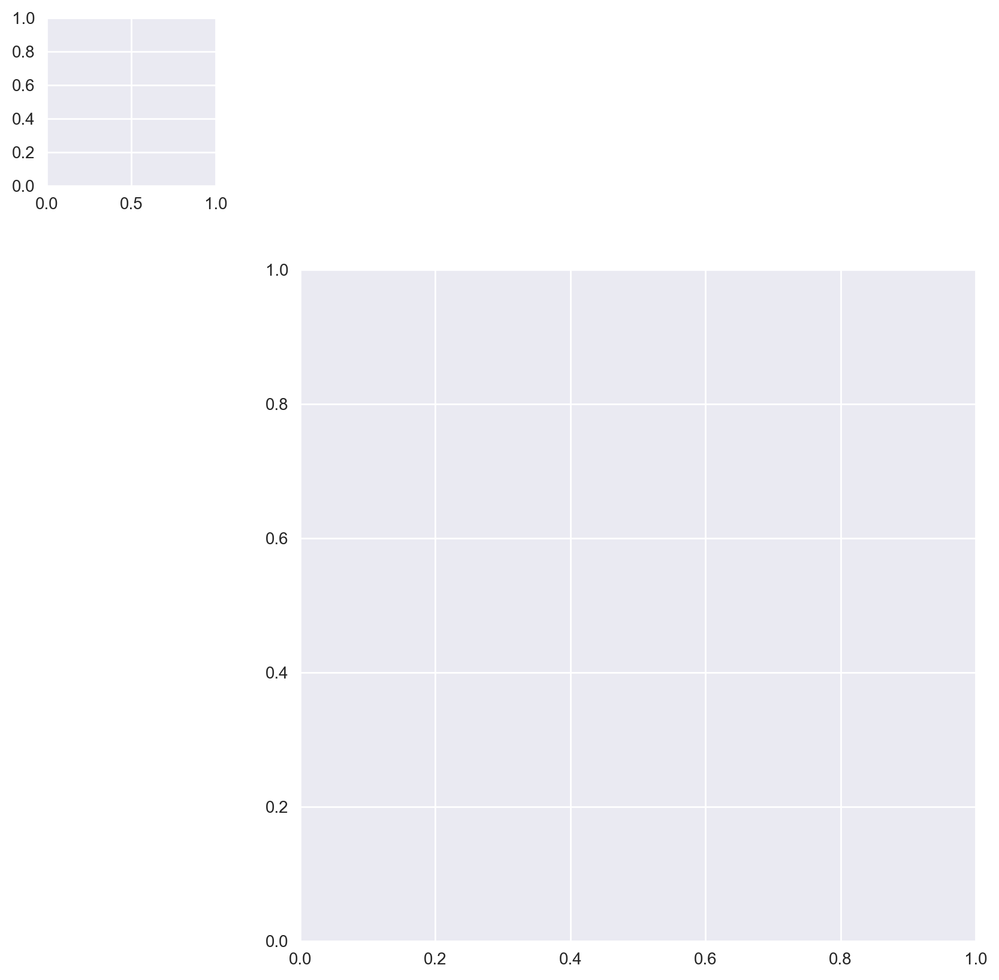

In [20]:
# clustermap to preview what features may be most important
sns.clustermap(X_feat.corr(), cmap="vlag")

In [ ]:
# train-test split
X_train, X_test, y_train, y_test = train_test_split_ts(X_feat, y, test_size=TEST_SIZE)

# standardize features
X_train, X_test, y_train, y_test = standardize_features(
    X_train, y_train, X_test, y_test
)

print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")

X_train, y_train indices are not aligned! Correcting...
Indices are now aligned!
X_test, y_test indices are not aligned! Correcting...
Indices are now aligned!
X_train shape: (767, 113)
X_test shape: (226, 113)
y_train shape: (767,)
y_test shape: (226,)


In [ ]:
%%capture
# check if any strong cross-correlations, which could indicate what the most important vars are + if there is multicollinearity
y_correlation = []
for col in X_train.columns:
    corr, pvalue = stats.pearsonr(X_train[col], y_train)
    y_correlation.append({"feature": col, "corr": corr, "pvalue": pvalue})
    print(f"Correlation for {col:<44} is {corr:>5.2f}, p-value = {pvalue:.4f}")

In [ ]:
# select only the most important features - eliminate multicollinear features, hopefully this way
X_train_feat_corr = pd.DataFrame.from_records(y_correlation).query("pvalue < 0.001")

# filter down further
X_train_ols_cols_top = (
    X_train_feat_corr.sort_values(by="pvalue").iloc[:10]["feature"].to_list()
)
X_train_ols_top = X_train[X_train_ols_cols_top]
X_test_ols_top = X_test[X_train_ols_cols_top]

In [ ]:
# train_ols_top
fit_ols_top = train_ols(X_train_ols_top, y_train)

In [ ]:
# summarize results for train_ols_top
fit_ols_top.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                 Results: Ordinary least squares
==================================================================
Model:              OLS              Adj. R-squared:     0.841    
Dependent Variable: y                AIC:                776.8648 
Date:               2025-04-27 03:09 BIC:                827.9322 
No. Observations:   767              Log-Likelihood:     -377.43  
Df Model:           10               F-statistic:        407.0    
Df Residuals:       756              Prob (F-statistic): 2.17e-296
R-squared:          0.843            Scale:              0.15894  
------------------------------------------------------------------
                    Coef.  Std.Err.    t    P>|t|   [0.025  0.975]
------------------------------------------------------------------
const              -0.0000   0.0144 -0.0000 1.0000 -0.0283  0.0283
spread_7d           0.7693   0.0336 22.8953 0.0000  0.7034  0.8353
spread_14d          0.0562   0.0547  1.0277 0.3044 -0.0511  0.1635
spread_28d          0.1655   0.0656  2.5220 0.0119  0.0367  0.2942
bid_max_7d         -1.0905   0.3887 -2.8057 0.0051 -1.8535 -0.3275
bid_last_price_max  0.4465   0.3292  1.3561 0.1755 -0.1999  1.0928
bid_max_14d         0.1263   0.4099  0.3082 0.7580 -0.6783  0.9309
spread_56d         -0.0917   0.0791 -1.1591 0.2468 -0.2470  0.0636
bid_max_28d         0.7998   0.4413  1.8123 0.0703 -0.0665  1.6661
bid_max_56d        -0.2849   0.2232 -1.2765 0.2022 -0.7230  0.1532
depth_midprice_14d -0.0063   0.0688 -0.0912 0.9274 -0.1414  0.1289
------------------------------------------------------------------
Omnibus:             249.003      Durbin-Watson:         1.832    
Prob(Omnibus):       0.000        Jarque-Bera (JB):      34799.467
Skew:                0.156        Prob(JB):              0.000    
Kurtosis:            35.997       Condition No.:         113      
==================================================================
Notes:
[1] Standard Errors assume that the covariance matrix of the
errors is correctly specified.
"""

In [ ]:
# train_ols with all data
fit_ols = train_ols(X_train, y_train)

In [ ]:
# summarize results for train_ols
fit_ols.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                      Results: Ordinary least squares
============================================================================
Model:                  OLS                 Adj. R-squared:        0.853    
Dependent Variable:     y                   AIC:                   808.5061 
Date:                   2025-04-27 03:09    BIC:                   1314.5372
No. Observations:       767                 Log-Likelihood:        -295.25  
Df Model:               108                 F-statistic:           42.09    
Df Residuals:           658                 Prob (F-statistic):    9.85e-234
R-squared:              0.874               Scale:                 0.14739  
----------------------------------------------------------------------------
                             Coef.  Std.Err.    t    P>|t|   [0.025   0.975]
----------------------------------------------------------------------------
const                        0.0000   0.0139  0.0000 1.0000  -0.0272  0.0272
vix                          0.1498   0.1098  1.3637 0.1731  -0.0659  0.3654
spy                          0.8887   0.6569  1.3529 0.1765  -0.4011  2.1785
arkx                        -0.8536   0.4061 -2.1021 0.0359  -1.6509 -0.0562
xli                          0.1466   0.4724  0.3103 0.7564  -0.7809  1.0741
treasury_10y                 0.0785   0.3419  0.2295 0.8186  -0.5930  0.7499
fed_rate                    -1.3335   0.9038 -1.4754 0.1406  -3.1081  0.4412
cpi                          2.8566   1.7237  1.6573 0.0979  -0.5280  6.2412
unemp_u3                     0.5355   1.0579  0.5062 0.6129  -1.5418  2.6128
unemp_u6                    -0.6116   1.1334 -0.5396 0.5897  -2.8371  1.6140
m2                          -0.3652   1.4387 -0.2539 0.7997  -3.1903  2.4598
bid_last_price_max           1.0618   0.4217  2.5180 0.0120   0.2338  1.8898
bid_last_size_max            0.0228   0.0230  0.9946 0.3203  -0.0222  0.0679
ask_last_price_min          -0.1105   0.1795 -0.6154 0.5385  -0.4629  0.2420
ask_last_size_min            0.0488   0.0224  2.1751 0.0300   0.0047  0.0929
days_since_bid               0.0030   0.0117  0.2583 0.7962  -0.0199  0.0259
days_since_ask               0.0116   0.0125  0.9308 0.3523  -0.0129  0.0361
days_ask_minus_bid          -0.0068   0.0092 -0.7375 0.4611  -0.0249  0.0113
book_imbalance_7d            0.0516   0.0339  1.5200 0.1290  -0.0151  0.1182
depth_midprice_7d           -0.1937   0.1451 -1.3356 0.1822  -0.4786  0.0911
slope_bid_7d                -0.1386   0.0290 -4.7721 0.0000  -0.1956 -0.0816
slope_ask_7d                -0.0340   0.0200 -1.6994 0.0897  -0.0732  0.0053
bid_count_7d                -0.0131   0.0387 -0.3394 0.7344  -0.0891  0.0629
ask_count_7d                -0.0337   0.0481 -0.7009 0.4836  -0.1282  0.0608
bid_size_total_7d           -0.0373   0.0438 -0.8524 0.3943  -0.1233  0.0487
ask_size_total_7d            0.0515   0.0579  0.8906 0.3735  -0.0621  0.1651
bid_max_7d                  -0.7576   0.2469 -3.0690 0.0022  -1.2423 -0.2729
ask_min_7d                  -0.6412   0.2576 -2.4896 0.0130  -1.1470 -0.1355
spread_7d                    0.8021   0.0605 13.2551 0.0000   0.6833  0.9210
book_imbalance_14d          -0.0179   0.0463 -0.3855 0.7000  -0.1088  0.0731
depth_midprice_14d           0.1133   0.1271  0.8913 0.3731  -0.1363  0.3630
slope_bid_14d                0.0083   0.0247  0.3341 0.7384  -0.0403  0.0568
slope_ask_14d                0.0106   0.0189  0.5627 0.5739  -0.0265  0.0477
bid_count_14d               -0.0229   0.0529 -0.4337 0.6646  -0.1268  0.0809
ask_count_14d                0.0233   0.0623  0.3748 0.7080  -0.0989  0.1456
bid_size_total_14d          -0.0094   0.0586 -0.1608 0.8723  -0.1244  0.1056
ask_size_total_14d          -0.0117   0.0723 -0.1613 0.8719  -0.1536  0.1303
bid_max_14d                 -0.4917   0.2761 -1.7808 0.0754  -1.0339  0.0505
ask_min_14d                 -0.5295   0.3095 -1.7109 0.0876  -1.1372  0.0782
spread_14d                   0.1340   0.0745  1

In [ ]:
# evaluate ols_top
y_pred_ols_top, dict_evals_ols_top = evaluate_model(
    fit_ols_top, X_test_ols_top, y_test, model_type="ols", trace=None
)

RMSE: 0.2817
MAE: 0.1554
R2: 0.6846
MAPE: 51.6561
SMAPE: 35.5874


In [ ]:
# evaluate ols
y_pred_ols, dict_evals_ols = evaluate_model(
    fit_ols, X_test, y_test, model_type="ols", trace=None
)

RMSE: 1.3796
MAE: 1.1199
R2: -6.5635
MAPE: 468.9406
SMAPE: 177.6999


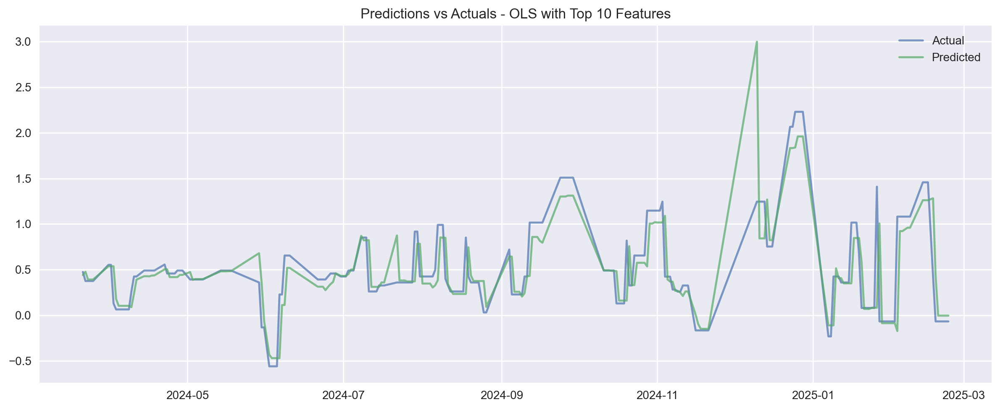

In [ ]:
# plot predictions - ols_top
plot_predictions(
    y_test, y_pred_ols_top, title="Predictions vs Actuals - OLS with Top 10 Features"
)

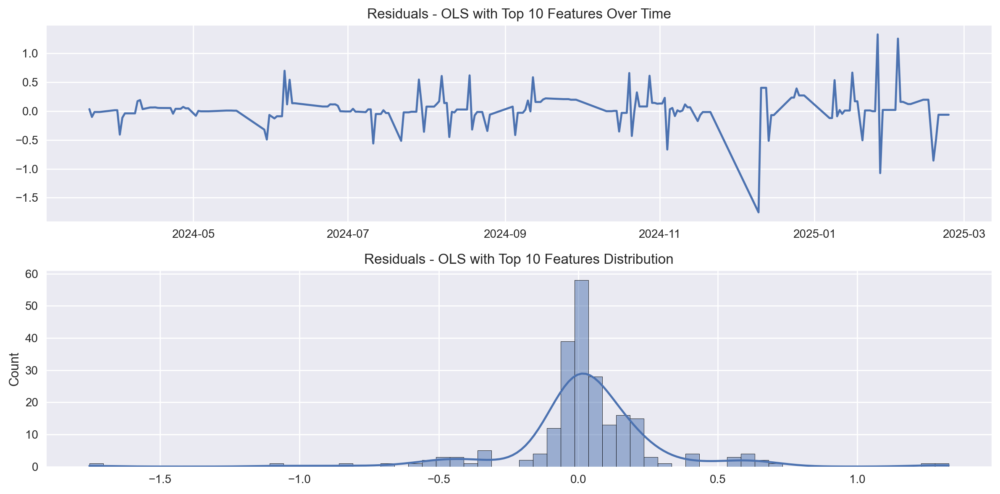

In [ ]:
# plot residuals - ols_top
plot_residuals(y_test, y_pred_ols_top, title="Residuals - OLS with Top 10 Features")

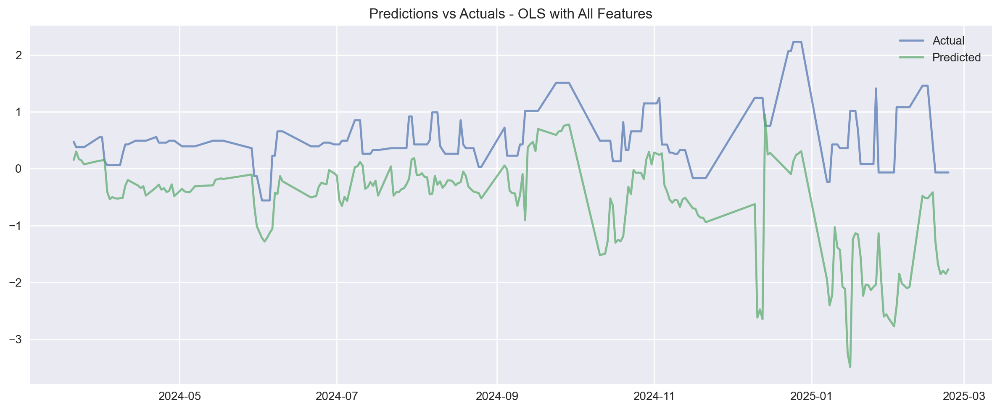

In [ ]:
# plot predictions - ols
plot_predictions(
    y_test, y_pred_ols, title="Predictions vs Actuals - OLS with All Features"
)

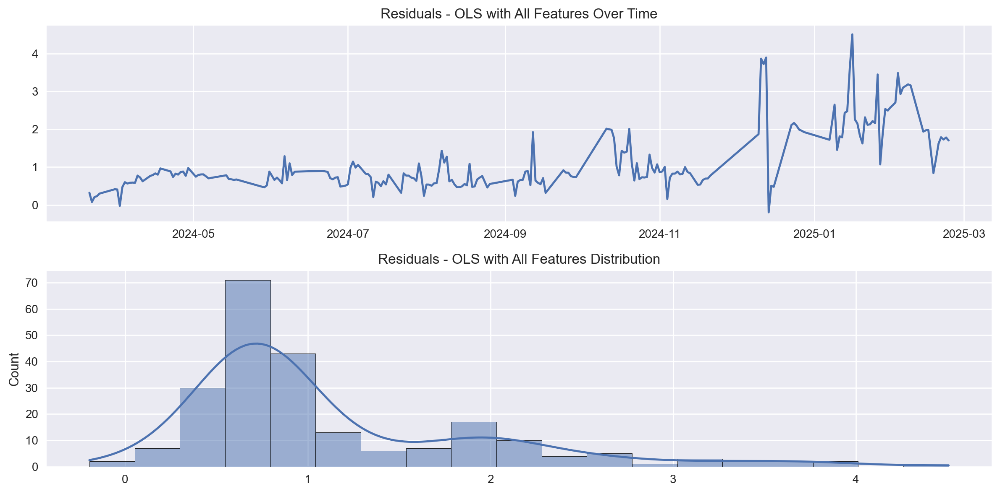

In [ ]:
# plot residuals - ols_top
plot_residuals(y_test, y_pred_ols, title="Residuals - OLS with All Features")

### Section 6B - XGBoost - Model Training + Evaluation

Using same feature selection as described above. Could theoretically throw all the data at it, including nan-values, but doing this to provide 1:1 comparison and for ease.

Though, I will use all the features and not select out for cross-correlations / multi-collinearity.

Certainly, hyper-parameter tuning would help - but that will come later.

In [ ]:
# train xgboost
model_xgboost = train_xgboost(X_train, y_train)

In [ ]:
# evaluate xgboost
y_pred_xgboost, dict_evals_xgboost = evaluate_model(
    model_xgboost, X_test, y_test, model_type="xgboost", trace=None
)

RMSE: 0.3086
MAE: 0.2075
R2: 0.6215
MAPE: 81.9699
SMAPE: 49.4075


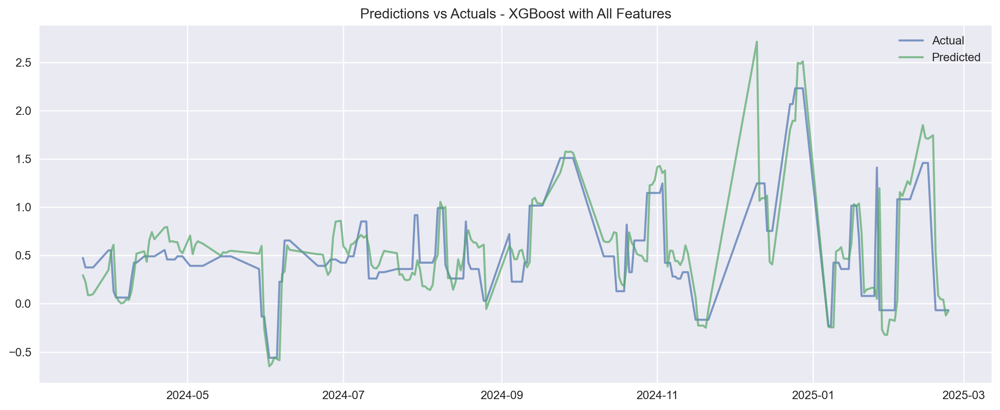

In [ ]:
# plot predictions - xgboost
plot_predictions(
    y_test, y_pred_xgboost, title="Predictions vs Actuals - XGBoost with All Features"
)

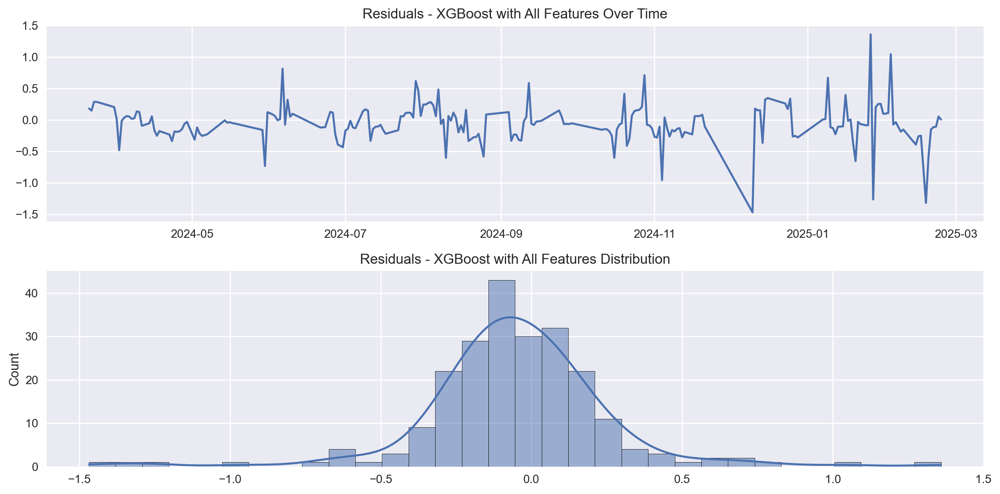

In [ ]:
# plot residuals - xgboost
plot_residuals(y_test, y_pred_xgboost, title="Residuals - XGBoost with All Features")

## Section 7 - Feature Importance
### Section 7A - XGBoost SHAP

In [ ]:
# load JS visualization code to notebook
shap.initjs()

# explain the model's predictions using SHAP
# (same syntax works for XGBoost, LightGBM, CatBoost, scikit-learn and spark models)
explainer = shap.TreeExplainer(model_xgboost)
shap_values = explainer.shap_values(
    X_train
)  # have to convert sparse matrix back to df for SHAP's indexing to work

In [ ]:
shap_values.shape

(767, 113)

In [ ]:
# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
# shape of shap_values and features should be the same
shap.force_plot(
    base_value=explainer.expected_value,
    shap_values=shap_values[0],
    features=X_train.iloc[0, :],
)

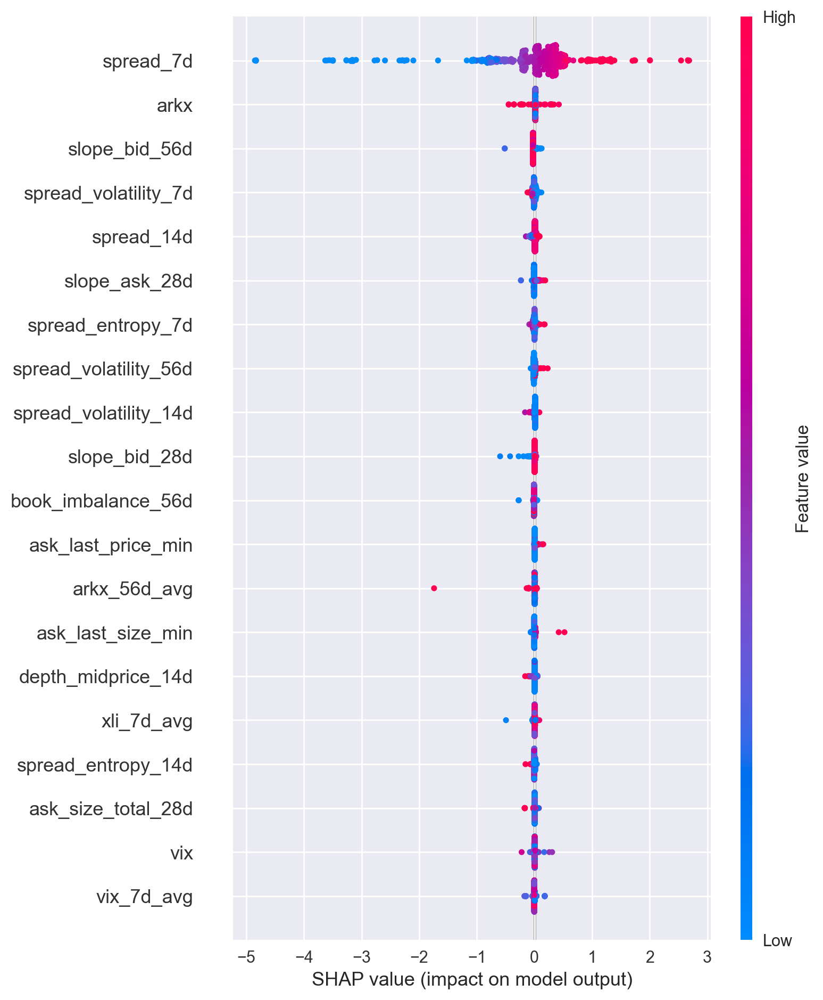

In [ ]:
# To get an overview of which features are most important for a model we can plot the SHAP values of every feature for every sample. The plot
# below sorts features by the sum of SHAP value magnitudes over all samples, and uses SHAP values to show the distribution of the impacts each
# feature has on the model output. The color represents the feature value (red high, blue low).

# summarize the effects of all the features
plt.title("SHAP Feature Importance - XGBoost Model (Train Data)")
shap.summary_plot(shap_values, X_train)

### Section 7B - Decision Tree Regressor for Visualization of Feature Importance / Decision Boundaries

Finally, we further diagnose our problem by visualizing a single decision tree regressor. This is more so for visualization/our human understanding. The decision tree will split the data at various nodes based on whether a given data point is likely to fall into a given data threshold.

We can see how important a lagged value like `spread_7d` plays in model predictions, where `y_target = spread_7d_future`. The model is essentially just concerned with `spread_7d` dynamics. However, it's helpful to note that entirely exogenous variables like `vix_14d_avg` also play a helpful role in modeling.

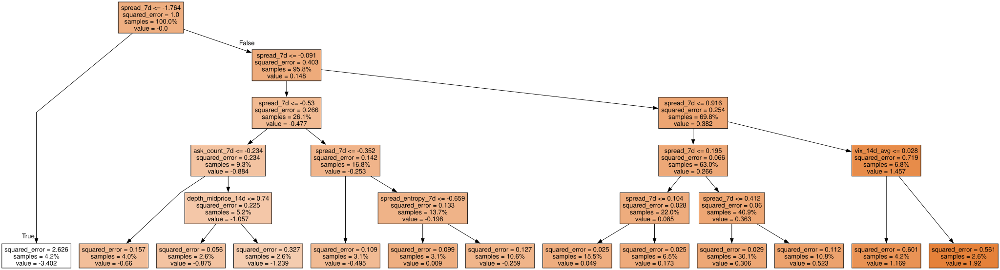

In [ ]:
# decision tree classifier
# perhaps just fit this on SMOTE x_train and y_train to illustrate difference w/ baseline
dt = DecisionTreeRegressor(max_depth=5, min_samples_leaf=20, min_samples_split=20)
dt.fit(X_train, y_train)

# for notebook
graph = Source(
    export_graphviz(
        dt,
        feature_names=X_train.columns,
        class_names=["paid", "not_paid"],
        proportion=True,
        leaves_parallel=True,
        filled=True,
        out_file=None,
    )
)

display(SVG(graph.pipe(format="svg")))